> # Setup

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
from scipy.io.wavfile import write

In [3]:
import librosa
mozart_file = "Signals/Music/Region of Interest.wav"
mozart_audio, mozart_sample_rate = librosa.load(mozart_file)

In [4]:
def plot_spectrogram(audio_data, sample_rate=mozart_sample_rate):
    """
    Plots the spectrogram of the audio data.

    Parameters:
        audio_data (numpy.ndarray): The audio signal data.
        sample_rate (int): The sample rate of the audio data.
    """
    S = np.abs(librosa.stft(audio_data))
    S_db = librosa.amplitude_to_db(S, ref=np.max)
    
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(S_db, sr=sample_rate, x_axis="time", y_axis="hz", cmap='magma')
    # plt.specgram(audio_data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap="YlOrRd")
    plt.colorbar(label="Intensity [dB]")
    plt.title("Spectrogram")
    plt.xlabel("Time [s]")
    plt.ylabel("Frequency [Hz]")
    plt.show()

def play_audio(audio_data, sample_rate=mozart_sample_rate):
    """
    Plays the audio data.

    Parameters:
        audio_data (numpy.ndarray): The audio signal data.
        sample_rate (int): The sample rate of the audio data.
    """
    # Normalize audio for IPython playback
    normalized_audio = np.int16(audio_data / np.max(np.abs(audio_data)) * 32767)

    # Temporary WAV file (to allow playback in Jupyter)
    write("temp_audio.wav", sample_rate, normalized_audio)
    return ipd.Audio("temp_audio.wav")

def plot_magnitude(ft_data, _frequencies):
    """
    Plots the magnitude of the Fourier Transform.
    :param _frequencies:
    :param ft_data:
    :return:
    """
    _ft_magnitude = np.abs(ft_data)
    plt.figure(figsize=(10, 6))
    plt.plot(_frequencies, _ft_magnitude)
    plt.title("Fourier Transform")
    plt.xlabel("Frequency [Hz]")
    plt.ylabel("Magnitude")
    plt.show()

def inverse_ft(ft_data):
    _shifted_ft = np.fft.ifftshift(ft_data)
    _filtered_signal = np.fft.ifft(_shifted_ft)
    _filtered_signal = np.real(_filtered_signal)
    return _filtered_signal

def export_to_file(audio_data, file_name, sample_rate=mozart_sample_rate):
    """
    Exports the audio data to a file.

    Parameters:
        audio_data (numpy.ndarray): The audio signal data.
        sample_rate (int): The sample rate of the audio data.
        file_name (str): The name of the file to save the audio data to.
    """
    # Normalize audio for IPython playback
    normalized_audio = np.int16(audio_data / np.max(np.abs(audio_data)) * 32767)

    # Save the audio data to a WAV file
    write(file_name, sample_rate, normalized_audio)

In [5]:
play_audio(mozart_audio, mozart_sample_rate)

> # Plottings

In [ ]:
region_1 = mozart_audio[60 * mozart_sample_rate : 76 * mozart_sample_rate]

In [ ]:
plot_spectrogram(region_1, mozart_sample_rate)
play_audio(region_1, mozart_sample_rate)

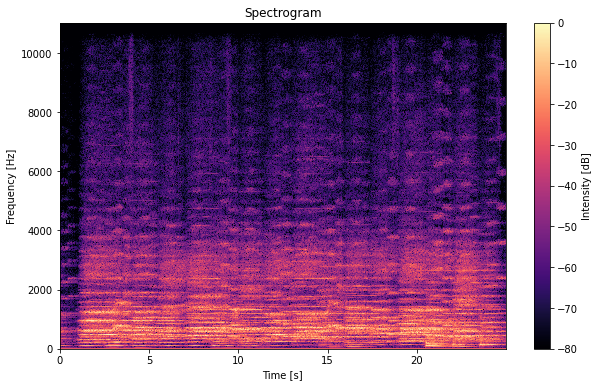

In [26]:
region_of_interest = mozart_audio[60 * mozart_sample_rate : 85 * mozart_sample_rate]
plot_spectrogram(region_of_interest) 
export_to_file(region_of_interest, "Signals/Music/Region of Interest.wav")
play_audio(region_of_interest, mozart_sample_rate)

In [28]:
region_of_interest_plus_plus = mozart_audio[60 * mozart_sample_rate : 95 * mozart_sample_rate]
export_to_file(region_of_interest_plus_plus, "Signals/Music/Region of Interest++.wav")

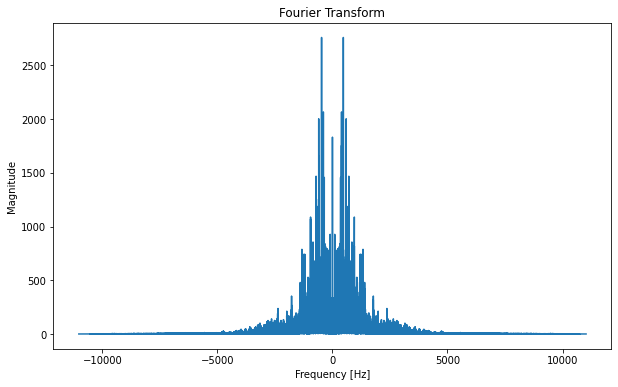

In [8]:
ft = np.fft.fft(mozart_audio)
ft = np.fft.fftshift(ft)
frequencies = np.fft.fftfreq(len(ft), 1/mozart_sample_rate)
frequencies = np.fft.fftshift(frequencies)

region_of_interest_ft = np.fft.fft(region_of_interest)
region_of_interest_ft = np.fft.fftshift(region_of_interest_ft)
region_of_interest_frequencies = np.fft.fftfreq(len(region_of_interest_ft), 1/mozart_sample_rate)
region_of_interest_frequencies = np.fft.fftshift(region_of_interest_frequencies)
plot_magnitude(region_of_interest_ft, region_of_interest_frequencies)

> # Formants Testing

## Remove 'A' formant - Works?

In [6]:
# remove 'A' formant (F1: 730, F2: 1090)
def filter_a(audio_ft, _frequencies):
    _modified_ft = audio_ft.copy()
    _modified_ft[(_frequencies >= 600) & (_frequencies <= 900)] = 0
    _modified_ft[(_frequencies >= -900) & (_frequencies <= -600)] = 0
    _modified_ft[(_frequencies >= 1000) & (_frequencies <= 1180)] = 0
    _modified_ft[(_frequencies >= -1180) & (_frequencies <= -1000)] = 0
    return _modified_ft

In [8]:
play_audio(mozart_audio)

In [7]:
ft = np.fft.fft(mozart_audio)
ft = np.fft.fftshift(ft)
frequencies = np.fft.fftfreq(len(ft), 1/mozart_sample_rate)
frequencies = np.fft.fftshift(frequencies)
modified_ft = filter_a(ft, frequencies)
filtered_signal = inverse_ft(modified_ft)
play_audio(filtered_signal, mozart_sample_rate)

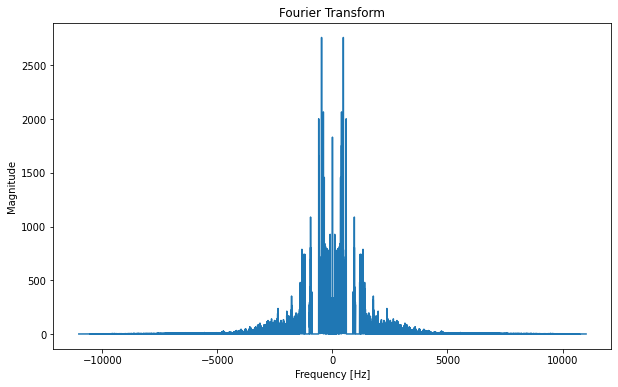

In [10]:
modified_ft = filter_a(region_of_interest_ft, region_of_interest_frequencies)
plot_magnitude(modified_ft, region_of_interest_frequencies)

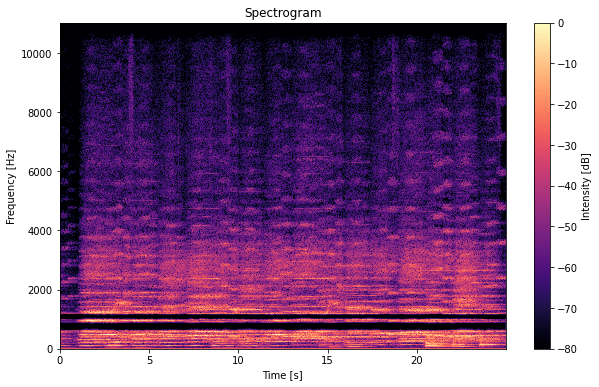

In [11]:
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal, mozart_sample_rate)
play_audio(filtered_signal, mozart_sample_rate)

In [12]:
export_to_file(filtered_signal, "Signals/Music/A formant removed.wav")

In [ ]:
plot_spectrogram(region_of_interest, mozart_sample_rate)
play_audio(region_of_interest, mozart_sample_rate)

In [ ]:
modified_regions = np.array_split(filtered_signal, 5)
original_regions = np.array_split(region_of_interest, 5)

#### Per region comparisons

In [ ]:
print("Region 1")
print("Original")
play_audio(original_regions[0])

In [ ]:
print("Modified")
play_audio(modified_regions[0])

In [ ]:
plot_spectrogram(original_regions[0])
plot_spectrogram(modified_regions[0])

In [ ]:
print("Region 2")
print("Original")
play_audio(original_regions[1])

In [ ]:
print("Modified")
play_audio(modified_regions[1])

In [ ]:
print("Region 3")
print("Original")
play_audio(original_regions[2])

In [ ]:
print("Modified")
play_audio(modified_regions[2])

In [ ]:
print("Region 4")
print("Original")
play_audio(original_regions[3])

In [ ]:
print("Modified")
play_audio(modified_regions[3])

In [ ]:
print("Region 5")
print("Original")
play_audio(original_regions[4])

In [ ]:
print("Modified")
play_audio(modified_regions[4])  # Controversial

## Remove 'UH' formant - Works ?

In [13]:
# remove 'UH' formant (F1: 520, F2: 1190)
def filter_uh(audio_ft, _frequencies):
    _modified_ft = audio_ft.copy()
    _modified_ft[(_frequencies >= 400) & (_frequencies <= 600)] = 0
    _modified_ft[(_frequencies >= -600) & (_frequencies <= -400)] = 0
    _modified_ft[(_frequencies >= 1130) & (_frequencies <= 1250)] = 0
    _modified_ft[(_frequencies >= -1250) & (_frequencies <= -1130)] = 0
    return _modified_ft

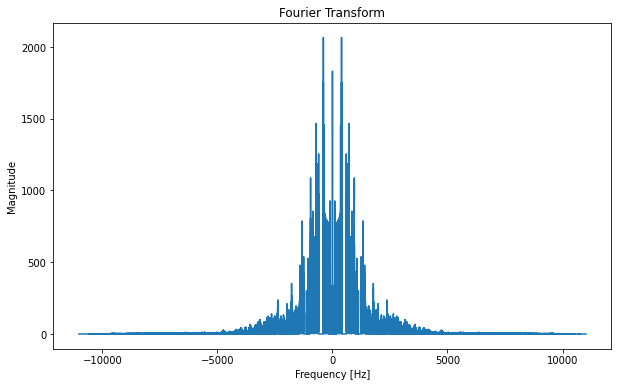

In [16]:
modified_ft = filter_uh(region_of_interest_ft, region_of_interest_frequencies)
plot_magnitude(modified_ft, region_of_interest_frequencies)

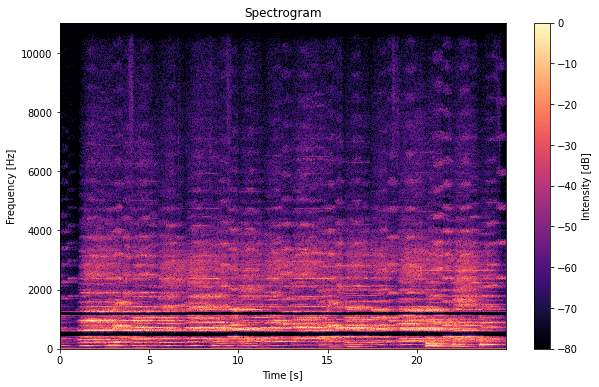

In [17]:
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal, mozart_sample_rate)
play_audio(filtered_signal, mozart_sample_rate)

In [19]:
export_to_file(filtered_signal, "Signals/Music/UH formant removed.wav")

In [ ]:
modified_regions = np.array_split(filtered_signal, 5)

#### Per region comparisons

In [ ]:
print("Region 1")
print("Original")
play_audio(original_regions[0])

In [ ]:
print("Modified")
play_audio(modified_regions[0])

In [ ]:
print("Region 2")
print("Original")
play_audio(original_regions[1])

In [ ]:
print("Modified")
play_audio(modified_regions[1])

In [ ]:
print("Region 3")
print("Original")
play_audio(original_regions[2])

In [ ]:
print("Modified")
play_audio(modified_regions[2])

In [ ]:
print("Region 4")
print("Original")
play_audio(original_regions[3])

In [ ]:
print("Modified")
play_audio(modified_regions[3])

In [ ]:
print("Region 5")
print("Original")
play_audio(original_regions[4])

In [ ]:
print("Modified")
play_audio(modified_regions[4])

### Both 'A' and 'UH'

In [ ]:
# remove 'A' and 'UH'
modified_ft = filter_a(ft, frequencies)
modified_ft = filter_uh(modified_ft, frequencies)
# plot the magnitude of the Fourier Transform
plot_magnitude(modified_ft, frequencies)

In [ ]:
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal)
play_audio(filtered_signal)

#### 'A' and 'UH' sounds removed, almost all vocals

In [ ]:
modified_regions = np.array_split(filtered_signal, 5)

#### Per region comparisons

In [ ]:
print("Region 1")
print("Original")
play_audio(original_regions[0])

In [ ]:
print("Modified")
play_audio(modified_regions[0])

In [ ]:
print("Region 2")
print("Original")
play_audio(original_regions[1])

In [ ]:
print("Modified")
play_audio(modified_regions[1])

In [ ]:
print("Region 3")
print("Original")
play_audio(original_regions[2])

In [ ]:
print("Modified")
play_audio(modified_regions[2])

In [ ]:
print("Region 4")
print("Original")
play_audio(original_regions[3])

In [ ]:
print("Modified")
play_audio(modified_regions[3])

In [ ]:
print("Region 5")
print("Original")
play_audio(original_regions[4])

In [ ]:
print("Modified")
play_audio(modified_regions[4])

## Remove 'EE' formant

In [ ]:
# remove 'EE' formant (F1: 270, F2: 2290)
def filter_ee(audio_ft, _frequencies):
    _modified_ft = audio_ft.copy()
    _modified_ft[(_frequencies > 250) & (_frequencies < 300)] = 0
    _modified_ft[(_frequencies > -300) & (_frequencies < -250)] = 0
    _modified_ft[(_frequencies > 2200) & (_frequencies < 2350)] = 0
    _modified_ft[(_frequencies > -2350) & (_frequencies < -2200)] = 0
    return _modified_ft

In [ ]:
modified_ft = filter_ee(ft, frequencies)
# plot the magnitude of the Fourier Transform
plot_magnitude(modified_ft, frequencies)

In [ ]:
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal, mozart_sample_rate)
play_audio(filtered_signal, mozart_sample_rate)

In [ ]:
plot_spectrogram(mozart_audio)
play_audio(mozart_audio)

In [ ]:
modified_regions = np.array_split(filtered_signal, 5)

In [ ]:
print("Region 1")
print("Original")
play_audio(original_regions[0])

In [ ]:
print("Modified")
play_audio(modified_regions[0])

In [ ]:
print("Region 2")
print("Original")
play_audio(original_regions[1])

In [ ]:
print("Modified")
play_audio(modified_regions[1])

In [ ]:
print("Region 3")
print("Original")
play_audio(original_regions[2])

In [ ]:
print("Modified")
play_audio(modified_regions[2])

In [ ]:
print("Region 4")
print("Original")
play_audio(original_regions[3])

In [ ]:
print("Modified")
play_audio(modified_regions[3])

In [ ]:
print("Region 5")
print("Original")
play_audio(original_regions[4])

In [ ]:
print("Modified")
play_audio(modified_regions[4])

# Remove Drum - Works :)



In [20]:
def filter_drum(audio_ft, _frequencies):
    # C#2 notes of drum in this song (around 114 Hz)
    # And A#3 notes of percussion (around 398 Hz)
    _modified_ft = audio_ft.copy()
    _modified_ft[(_frequencies > 0) & (_frequencies < 300)] = 0
    _modified_ft[(_frequencies > -300) & (_frequencies < 0)] = 0
    # _modified_ft[(_frequencies > 70) & (_frequencies < 150)] = 0
    # _modified_ft[(_frequencies > -150) & (_frequencies < -70)] = 0
    # _modified_ft[(_frequencies > 350) & (_frequencies < 470)] = 0
    # _modified_ft[(_frequencies > -470) & (_frequencies < -350)] = 0
    return _modified_ft

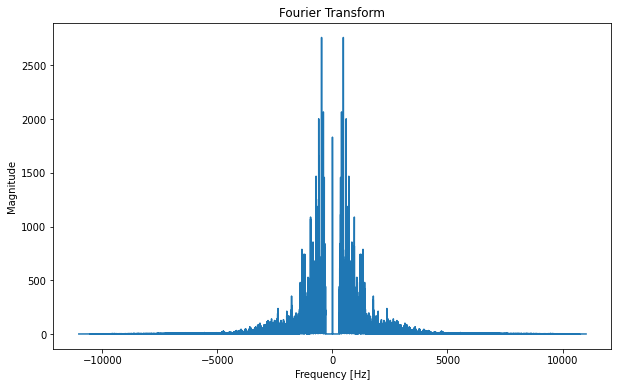

In [21]:
modified_ft = filter_drum(region_of_interest_ft, region_of_interest_frequencies)
plot_magnitude(modified_ft, region_of_interest_frequencies)

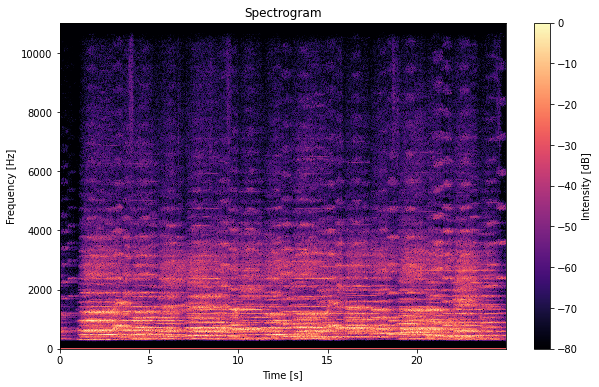

In [22]:
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal, mozart_sample_rate)
play_audio(filtered_signal, mozart_sample_rate)

In [23]:
export_to_file(filtered_signal, "Signals/Music/Drum removed.wav")

In [ ]:
modified_ft = filter_a(region_of_interest_ft, region_of_interest_frequencies)
modified_ft = filter_drum(modified_ft, region_of_interest_frequencies)
plot_magnitude(modified_ft, region_of_interest_frequencies)
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal, mozart_sample_rate)
play_audio(filtered_signal)

# A, UH, and Drums Removal

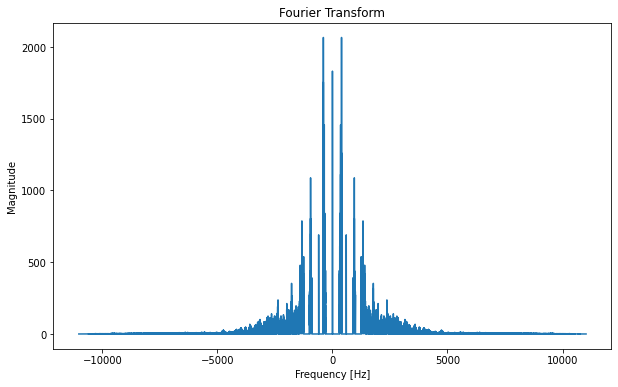

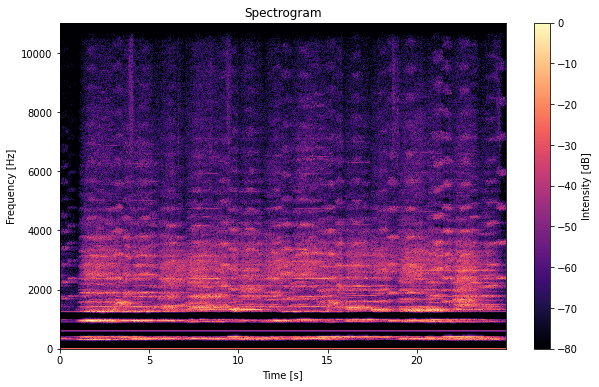

In [25]:
modified_ft = filter_a(region_of_interest_ft, region_of_interest_frequencies)
modified_ft = filter_uh(modified_ft, region_of_interest_frequencies)
modified_ft = filter_drum(modified_ft, region_of_interest_frequencies)
plot_magnitude(modified_ft, region_of_interest_frequencies)
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal, mozart_sample_rate)
play_audio(filtered_signal)
export_to_file(filtered_signal, "Signals/Music/A, UH, Drum removed.wav")

# Remove Violin

In [33]:
def filter_violin_test(audio_ft, _frequencies):
    _modified_ft = audio_ft.copy()
    _modified_ft[(_frequencies > 300) & (_frequencies < 400)] = 0
    _modified_ft[(_frequencies > -400) & (_frequencies < -300)] = 0
    _modified_ft[(_frequencies > 900) & (_frequencies < 1000)] = 0
    _modified_ft[(_frequencies > -1000) & (_frequencies < -900)] = 0
    _modified_ft[(_frequencies > 1500)] = 0
    _modified_ft[(_frequencies < -1500)] = 0
    return _modified_ft

In [34]:
modified_ft = filter_violin_test(region_of_interest_ft, region_of_interest_frequencies)
filtered_signal = inverse_ft(modified_ft)
export_to_file(filtered_signal, "Signals/Music/Violin removed.wav")

In [ ]:
plot_magnitude(region_of_interest_ft, region_of_interest_frequencies)

In [ ]:
modified_ft = filter_violin(region_of_interest_ft, region_of_interest_frequencies)
plot_magnitude(modified_ft, region_of_interest_frequencies)
filtered_signal = inverse_ft(modified_ft)
plot_spectrogram(filtered_signal, mozart_sample_rate)
play_audio(filtered_signal)

In [ ]:
play_audio(region_of_interest)